In [1]:
#Загружаем необходимые для анализа библиотеки:


import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
from scipy import stats
from scipy.stats import permutation_test
from sklearn import preprocessing
import statsmodels.formula.api as smf
import string



In [2]:
#Функция bootstrap
def bootstrap1(arr, n=1000, N_TRIAL = 10000, func = np.mean):
    res = []
    # Инициализируем цикл попыток
    for _ in range(N_TRIAL):
        # Делаем подвыборку размера n
        if len(arr.shape)>1:
            ind = np.random.choice(np.arange(arr.shape[0]), size = (n,))
            subsample = arr.iloc[ind]
        else:
            subsample = np.random.choice(arr, size = (n,))
        # рассчитываем статистику
        stat = func(subsample)
        res.append(stat)
    return res

In [3]:
# Функция для Перестановочного критерия
def statistic(x, y, axis):
    return np.median(x, axis=axis) - np.median(y, axis=axis)

In [4]:
#Функция для переименования столбцов. Используется для формули линейной регрессии
def rename_col(arr):
    punct = string.punctuation
    punct = punct +' '
    for i , name in enumerate(arr[1:]):
        new_name = list(name)
        text=''

        for i_text in new_name:
            if i_text not in punct:
                text =  text + i_text

        arr.rename(columns={name: text}, inplace=True)
    return arr

In [5]:
#Функция для расчета p-value, используя перестановочный критерий
def col_permutation(df_x, df_y, col_num):
    PTp_SS_dict = dict()

    for name in df_x.columns[col_num:]:

        PTpSS = permutation_test((df_x[name], df_y[name]), statistic,
                             vectorized=True,
                             n_resamples=10000 ,
                             permutation_type ='independent',
                             alternative='two-sided')

        PTp_SS_dict[name] = round(PTpSS.pvalue, 5)

    print('Значение p-value для каждого параметра')
    print('-'*50)
    for name in PTp_SS_dict.keys():
        print(f'{name}:\t{round(PTp_SS_dict[name],5)}')


In [6]:
name_Q2_df = pd.DataFrame(['Без нареканий  ' ,'1 - Недозвоны, обрывы при звонках  ',
             '2 - Время ожидания гудков при звонке  ',
             '3 - Плохое качество связи в зданиях  ',
             '4 - Медленный мобильный интернет  ',
             '5 - Медленная загрузка видео  ',
             '6 - Затрудняюсь ответить  ',
             '7 - Свой вариант ответа  '])

### 1) Загружаем файл и знакомимся с данными, которые он содержит.

In [7]:
#Загружаем данные и знакомимся с ними:
#megafon_df = pd.read_csv('megafon.csv')
megafon_df = pd.read_csv('/Volumes/HDD/Data_Science/An_project/megafon.csv')
megafon_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3112 entries, 0 to 3111
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   user_id                                    3112 non-null   int64  
 1   Q1                                         3110 non-null   object 
 2   Q2                                         1315 non-null   object 
 3   Total Traffic(MB)                          3112 non-null   float64
 4   Downlink Throughput(Kbps)                  3112 non-null   float64
 5   Uplink Throughput(Kbps)                    3112 non-null   float64
 6   Downlink TCP Retransmission Rate(%)        3112 non-null   float64
 7   Video Streaming Download Throughput(Kbps)  3112 non-null   float64
 8   Video Streaming xKB Start Delay(ms)        3112 non-null   int64  
 9   Web Page Download Throughput(Kbps)         3112 non-null   float64
 10  Web Average TCP RTT(ms) 

In [8]:
megafon_df.describe()

,user_id,Total Traffic(MB),Downlink Throughput(Kbps),Uplink Throughput(Kbps),Downlink TCP Retransmission Rate(%),Video Streaming Download Throughput(Kbps),Video Streaming xKB Start Delay(ms),Web Page Download Throughput(Kbps),Web Average TCP RTT(ms)
count,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000
mean,1556.500000,406.282339,2220.774023,170.702381,1.834518,5728.806848,2107.596080,2100.258901,194.195051
std,898.501345,220.593815,2629.824405,204.031286,2.074593,5161.475235,1582.423057,2062.509549,267.387914
min,1.000000,100.026680,13.260000,6.110000,0.050000,0.000000,239.000000,0.000000,0.000000
25%,778.750000,214.261192,652.297500,70.735000,0.720000,2324.550000,1280.000000,1018.002500,74.000000
50%,1556.500000,363.999720,1404.230000,119.435000,1.300000,4436.500000,1672.000000,1670.695000,118.000000
75%,2334.250000,572.524325,2823.645000,210.617500,2.240000,7611.440000,2312.000000,2519.987500,207.000000
max,3112.000000,887.078270,39817.640000,4141.850000,31.200000,58566.030000,21392.000000,35603.970000,3471.000000


Файл с данными содержит 3112 строк и 12 колонок c различными типами данных.
Ранее мы ознакомились с инфографикой по структуре опроса и можем сделать следующие выводы:
Данные содержат информацию:
- iser_id : каждому участнику опроса присвоен индивидуальный номер
- Q1: Ответ на первый этап опроса
- Q2: Ответ на второй этап опроса
- Столбцы 3-10 содержат информацию по работе сети у опрошенного клиента


### 2) Данные содержат ответы клиентов (Q1 и Q2), которые заполнялись клиентом, эти данные могут содержать ошибки.

In [9]:
#Так как первая часть опроса подразумевает ответ в виде целого число от 1 до 10, отфильтруем данные согласно этому условию:
#Создадим объект Seria, содержащий числа от 1 до 10 типа str, так как в столбце Q1 хранится именно такой тип данных
num_answer = pd.Series([str(x) for x in range(1,11)])
#Применим фильтр и ознакомимся с результатом:
megafon_df = megafon_df[megafon_df['Q1'].isin(num_answer)]
#Изменим тип данных в колонке с первым ответом на числовой:
megafon_df['Q1']=megafon_df['Q1'].astype(int)
megafon_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3058 entries, 0 to 3111
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   user_id                                    3058 non-null   int64  
 1   Q1                                         3058 non-null   int64  
 2   Q2                                         1315 non-null   object 
 3   Total Traffic(MB)                          3058 non-null   float64
 4   Downlink Throughput(Kbps)                  3058 non-null   float64
 5   Uplink Throughput(Kbps)                    3058 non-null   float64
 6   Downlink TCP Retransmission Rate(%)        3058 non-null   float64
 7   Video Streaming Download Throughput(Kbps)  3058 non-null   float64
 8   Video Streaming xKB Start Delay(ms)        3058 non-null   int64  
 9   Web Page Download Throughput(Kbps)         3058 non-null   float64
 10  Web Average TCP RTT(ms) 

In [10]:
megafon_df

,user_id,Q1,Q2,Total Traffic(MB),Downlink Throughput(Kbps),Uplink Throughput(Kbps),Downlink TCP Retransmission Rate(%),Video Streaming Download Throughput(Kbps),Video Streaming xKB Start Delay(ms),Web Page Download Throughput(Kbps),Web Average TCP RTT(ms)
0,1,5,NaN,775.48846,360.13,86.56,3.93,1859.15,2309,1007.82,83
1,2,5,4,861.96324,3023.54,411.18,1.27,667.47,2080,255.36,425
2,3,1,4,261.11860,790.96,34.20,1.79,1079.60,6367,535.85,485
3,4,8,3,179.18564,2590.97,325.88,0.80,7053.81,3218,1221.02,51
4,5,2,"2, 3, 4",351.99208,731.61,223.54,1.15,4550.38,1767,2336.56,68
...,...,...,...,...,...,...,...,...,...,...,...
3107,3108,3,"1, 4, 5",519.96475,1045.70,44.61,0.47,4523.66,1468,1044.66,304
3108,3109,3,"1, 3, 4, 5",171.52629,670.32,40.94,2.35,1711.54,2780,954.91,251
3109,3110,10,NaN,187.44936,590.29,186.36,2.06,3182.83,2195,1094.62,109
3110,3111,6,"1, 3",827.74515,1841.90,373.53,1.21,5675.93,1905,2361.88,202


После фильтрации датафрейм стал содержать 3058 строк.
Потери составили (3112 - 3058) / 3112 = 1.74%
Считаем данные потери незначительными.
Данные подготовлены для первой части анализа

In [11]:
megafon_df_1 = megafon_df[['Q1', 'Total Traffic(MB)',
                           'Downlink Throughput(Kbps)',
                           'Uplink Throughput(Kbps)',
                           'Downlink TCP Retransmission Rate(%)',
                           'Video Streaming Download Throughput(Kbps)',
                           'Video Streaming xKB Start Delay(ms)',
                           'Web Page Download Throughput(Kbps)',
                           'Web Average TCP RTT(ms)'
                           ]]
megafon_df_1.reset_index(inplace=True, drop=True)
megafon_df_1

,Q1,Total Traffic(MB),Downlink Throughput(Kbps),Uplink Throughput(Kbps),Downlink TCP Retransmission Rate(%),Video Streaming Download Throughput(Kbps),Video Streaming xKB Start Delay(ms),Web Page Download Throughput(Kbps),Web Average TCP RTT(ms)
0,5,775.48846,360.13,86.56,3.93,1859.15,2309,1007.82,83
1,5,861.96324,3023.54,411.18,1.27,667.47,2080,255.36,425
2,1,261.11860,790.96,34.20,1.79,1079.60,6367,535.85,485
3,8,179.18564,2590.97,325.88,0.80,7053.81,3218,1221.02,51
4,2,351.99208,731.61,223.54,1.15,4550.38,1767,2336.56,68
...,...,...,...,...,...,...,...,...,...
3053,3,519.96475,1045.70,44.61,0.47,4523.66,1468,1044.66,304
3054,3,171.52629,670.32,40.94,2.35,1711.54,2780,954.91,251
3055,10,187.44936,590.29,186.36,2.06,3182.83,2195,1094.62,109
3056,6,827.74515,1841.90,373.53,1.21,5675.93,1905,2361.88,202


In [12]:
megafon_df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3058 entries, 0 to 3057
Data columns (total 9 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Q1                                         3058 non-null   int64  
 1   Total Traffic(MB)                          3058 non-null   float64
 2   Downlink Throughput(Kbps)                  3058 non-null   float64
 3   Uplink Throughput(Kbps)                    3058 non-null   float64
 4   Downlink TCP Retransmission Rate(%)        3058 non-null   float64
 5   Video Streaming Download Throughput(Kbps)  3058 non-null   float64
 6   Video Streaming xKB Start Delay(ms)        3058 non-null   int64  
 7   Web Page Download Throughput(Kbps)         3058 non-null   float64
 8   Web Average TCP RTT(ms)                    3058 non-null   int64  
dtypes: float64(6), int64(3)
memory usage: 215.1 KB


### 3) Определим тип распределения данных, чтобы в дальнейшем выбрать критерии оценки данных

In [13]:
#Изучим распределения показателей
fig = make_subplots(rows=2, cols=4, subplot_titles=megafon_df_1.columns[1:], horizontal_spacing = 0.08, vertical_spacing = 0.1)

for i, name in enumerate(megafon_df_1.columns):
    if i > 0:
        fig.add_trace(go.Histogram(x=megafon_df_1[name],marker_color='steelblue'),
                      row=((i-1)//4+1),
                      col=(i-1)%4+1
                      )

    fig.add_vline(x=megafon_df_1[name].mean(), line_width = 1, line_color = 'green', row=((i-1)//4+1), col=((i-1)%4+1))
    fig.add_vline(x=megafon_df_1[name].median(), line_width = 1, line_color = 'red', row=((i-1)//4+1), col=((i-1)%4+1))

fig.update_layout(height=700, width=1500, showlegend=False, yaxis_title="", bargap=0.1)#, title='Распределение значений технических показателей')

fig.show()
fig.write_image("fig1.png")

### Оценив распределения значений параметров визуально, мы можем сделать вывод, что распределение ненормальное.
### Подтвердим это статистическим анализом, используя критерий Шапиро-Уилка и критерий согласия Пирсона.


In [14]:
print('Тест Шапиро-Уилка:')
print('-'*50)
for name in megafon_df_1.columns[1:]:
    shapiro_test = stats.shapiro(megafon_df_1[name])
    print(name, 'Значение p-value:\t',shapiro_test[1])

Тест Шапиро-Уилка:
--------------------------------------------------
Total Traffic(MB) Значение p-value:	 2.3444001935614603e-34
Downlink Throughput(Kbps) Значение p-value:	 0.0
Uplink Throughput(Kbps) Значение p-value:	 0.0
Downlink TCP Retransmission Rate(%) Значение p-value:	 0.0
Video Streaming Download Throughput(Kbps) Значение p-value:	 0.0
Video Streaming xKB Start Delay(ms) Значение p-value:	 0.0
Web Page Download Throughput(Kbps) Значение p-value:	 0.0
Web Average TCP RTT(ms) Значение p-value:	 0.0


In [15]:
print('Критерий согласия Пирсона:')
print('-'*50)
for name in megafon_df_1.columns[1:]:
    pirson_test = stats.normaltest(megafon_df_1[name])
    print(name, 'Значение p-value:\t',pirson_test[1])

Критерий согласия Пирсона:
--------------------------------------------------
Total Traffic(MB) Значение p-value:	 9.890203145889279e-133
Downlink Throughput(Kbps) Значение p-value:	 0.0
Uplink Throughput(Kbps) Значение p-value:	 0.0
Downlink TCP Retransmission Rate(%) Значение p-value:	 0.0
Video Streaming Download Throughput(Kbps) Значение p-value:	 0.0
Video Streaming xKB Start Delay(ms) Значение p-value:	 0.0
Web Page Download Throughput(Kbps) Значение p-value:	 0.0
Web Average TCP RTT(ms) Значение p-value:	 0.0


### Значения p-value теста Шапиро-Уилка и Пиросна, показывают уровень значимости, с которым мы можем отвергнуть Нулевую гипотезу. Распределения не нормальные.
### Так как распределения анализируемых данных не являются нормальными в дальнейшем для анализа, мы будем применять непараметрические критерии.

## Гипотеза №1:  Разницы между техническими параметрами у клиентов, которые ставили Негативную оценку, и техническими параметрами клиентов давших Позитивную оценку, нет


In [16]:
#Выясним какое соотношение клиентов дали позитивный и негативный отзывы и покажем это визуально
user_answers = megafon_df.groupby('Q1')['user_id'].count().reset_index()
user_answers['Q1, %'] = user_answers['user_id'] / user_answers['user_id'].sum()*100
user_answers['type_answer'] = np.where(user_answers['Q1'] < 9, 'Негативный', 'Позитивный')
user_answers = round(user_answers.groupby('type_answer')['Q1, %'].sum(),2).reset_index()
user_answers

,type_answer,"Q1, %"
0,Негативный,64.55
1,Позитивный,35.45


In [17]:
#для визуализации результата будем использовать столбчатую диаграмму
fig = px.bar(user_answers, x = 'type_answer', y = 'Q1, %',
             text='Q1, %',
             color='type_answer',
             #title='Ответы участников опроса по качеству услуг',
             height = 500, width=700,
             labels={ 'type_answer' : '', 'Q1, %': 'Количество ответивших, %'},
             color_discrete_map={
                 'Негативный': 'tomato',
                 'Позитивный': 'darkseagreen'},
             )
fig.update_xaxes(dtick=1)
fig.update_layout(showlegend=False)

fig.show()
fig.write_image("fig2.png")

In [18]:
#Гипотеза: H0 = Технические параметры у группы А равны техническим параметрам группы B
#Так как распределения ненормальное, а критерий мана-уитни использовать нельзя(по условию повторяющихся значений),
#для проверки гипотезы будем использовать Перестановочный критерий. p-valuem считается по разнице медиан 10000 выборок
print('Группа А - Клиенты, давшие позитивную оценку\nГруппа B - Клиенты давшие негативную оценку')
A = megafon_df_1[megafon_df_1['Q1'] >= 9]
B = megafon_df_1[megafon_df_1['Q1'] < 9]
col_permutation(A, B, 1)

Группа А - Клиенты, давшие позитивную оценку
Группа B - Клиенты давшие негативную оценку
Значение p-value для каждого параметра
--------------------------------------------------
Total Traffic(MB):	0.19758
Downlink Throughput(Kbps):	0.0002
Uplink Throughput(Kbps):	0.09659
Downlink TCP Retransmission Rate(%):	0.0002
Video Streaming Download Throughput(Kbps):	0.0002
Video Streaming xKB Start Delay(ms):	0.0002
Web Page Download Throughput(Kbps):	0.0002
Web Average TCP RTT(ms):	0.0002


In [19]:
fig = make_subplots(rows=2, cols=4, subplot_titles=megafon_df_1.columns[1:], horizontal_spacing = 0.08, vertical_spacing = 0.1)

for i, name in enumerate(megafon_df_1.columns):
    if i > 0:

        A = megafon_df_1.query("Q1 >= 9")[name]
        B = megafon_df_1.query("Q1 <= 9")[name]

        n = len(A) if len(A) < len(B) else len(B)

        samples_positive = bootstrap1(A, n = n)
        samples_negative = bootstrap1(B, n = n)

        fig.add_trace(go.Histogram(x=samples_positive,
                                   marker_color='darkseagreen'
                                   ),
                      row=((i-1)//4+1),
                      col=(i-1)%4+1)

        fig.add_trace(go.Histogram(x=samples_negative,
                                   marker_color='tomato'
                                   ),
                      row=((i-1)//4+1),
                      col=(i-1)%4+1)

        fig.add_vline(x=np.percentile(samples_positive , 2.5), line_width = 2, line_color = 'darkgreen', row=((i-1)//4+1), col=((i-1)%4+1))#, mode='lines+markers',  name= 'mean')
        fig.add_vline(x=np.percentile(samples_positive , 97.5), line_width = 2, line_color = 'darkgreen', line_dash="dash", row=((i-1)//4+1), col=((i-1)%4+1))

        fig.add_vline(x=np.percentile(samples_negative , 2.5), line_width = 2, line_color = 'darkred', row=((i-1)//4+1), col=((i-1)%4+1))#, mode='lines+markers',  name= 'mean')
        fig.add_vline(x=np.percentile(samples_negative , 97.5), line_width = 2, line_color = 'darkred', line_dash="dash", row=((i-1)//4+1), col=((i-1)%4+1))

        print(f'{name} ПОЗИТИВНЫЕ:\t {round(np.percentile(samples_positive, 2.5), 2)}\t/\t{round(np.percentile(samples_positive , 97.5), 2)}')
        print(f'{name} НЕГАТИВНЫЕ:\t {round(np.percentile(samples_negative , 2.5), 2)}\t/\t{round(np.percentile(samples_negative , 97.5), 2)}')
        print('-'*100)

fig.update_layout(height=700, width=1400, showlegend=False, yaxis_title="")


fig.show()
fig.write_image("fig3.png")

Total Traffic(MB) ПОЗИТИВНЫЕ:	 388.05	/	414.52
Total Traffic(MB) НЕГАТИВНЫЕ:	 394.05	/	419.77
----------------------------------------------------------------------------------------------------
Downlink Throughput(Kbps) ПОЗИТИВНЫЕ:	 2345.9	/	2671.16
Downlink Throughput(Kbps) НЕГАТИВНЫЕ:	 1972.92	/	2286.33
----------------------------------------------------------------------------------------------------
Uplink Throughput(Kbps) ПОЗИТИВНЫЕ:	 169.42	/	196.73
Uplink Throughput(Kbps) НЕГАТИВНЫЕ:	 155.71	/	179.39
----------------------------------------------------------------------------------------------------
Downlink TCP Retransmission Rate(%) ПОЗИТИВНЫЕ:	 1.55	/	1.76
Downlink TCP Retransmission Rate(%) НЕГАТИВНЫЕ:	 1.77	/	2.02
----------------------------------------------------------------------------------------------------
Video Streaming Download Throughput(Kbps) ПОЗИТИВНЫЕ:	 5994.24	/	6616.24
Video Streaming Download Throughput(Kbps) НЕГАТИВНЫЕ:	 5244.78	/	5859.26
---------------

### Вывод: С уровнем значимости 5% мы можем утверждать, что Данные групп принадлежат разным Генеральным совокупностям.

## Гипотеза №2: Оценка поставленная клиентом зависит от технических параметров

### Посмотрим как изменяется оценка клиента в зависимости от медианных значений технических параметров

In [20]:
megafon_df_1_median = megafon_df_1.groupby('Q1').median().reset_index()


fig = make_subplots(rows=2, cols=4, subplot_titles=megafon_df_1_median.columns[1:], horizontal_spacing = 0.08, vertical_spacing = 0.1)

for i, name in enumerate(megafon_df_1_median.columns):
    if i > 0:

        trendline = np.poly1d(np.polyfit(megafon_df_1_median['Q1'], megafon_df_1_median[name], 1))

        fig.add_trace(go.Scatter(x=megafon_df_1_median['Q1'], y = megafon_df_1_median[name], marker_color='steelblue', mode='markers', ),
                      row=((i-1)//4+1),
                      col=(i-1)%4+1
                      )

        fig.add_trace(go.Scatter(name='Линия тренда', x=megafon_df_1_median['Q1'], y=trendline(megafon_df_1_median['Q1']), mode='lines'),
                      row=((i-1)//4+1),
                      col=(i-1)%4+1
                      )

fig.update_layout(height=800, width=1500, showlegend=False, yaxis_title="", bargap=0.1)#, title='Линия тренда изменения оценки в зависимости от медианного значения технического показателя')
fig.update_xaxes(dtick=1)
fig.show()

fig.write_image("fig4.png")

### Подтвердим статистическим критерием
### Нормализуем данные

In [21]:
norm= preprocessing.normalize(megafon_df_1)
megafon_df_2 = pd.DataFrame(norm, columns=megafon_df_1.columns)
megafon_df_2

,Q1,Total Traffic(MB),Downlink Throughput(Kbps),Uplink Throughput(Kbps),Downlink TCP Retransmission Rate(%),Video Streaming Download Throughput(Kbps),Video Streaming xKB Start Delay(ms),Web Page Download Throughput(Kbps),Web Average TCP RTT(ms)
0,0.001539,0.238763,0.110879,0.026651,0.001210,0.572409,0.710912,0.310295,0.025555
1,0.001288,0.222029,0.778818,0.105914,0.000327,0.171930,0.535776,0.065777,0.109473
2,0.000153,0.039857,0.120730,0.005220,0.000273,0.164788,0.971845,0.081791,0.074029
3,0.000967,0.021657,0.313151,0.039387,0.000097,0.852542,0.388936,0.147576,0.006164
4,0.000365,0.064263,0.133570,0.040812,0.000210,0.830761,0.322600,0.426585,0.012415
...,...,...,...,...,...,...,...,...,...
3053,0.000598,0.103645,0.208440,0.008892,0.000094,0.901705,0.292618,0.208233,0.060597
3054,0.000862,0.049284,0.192600,0.011763,0.000675,0.491768,0.798763,0.274369,0.072119
3055,0.002456,0.046040,0.144982,0.045772,0.000506,0.781739,0.539116,0.268851,0.026772
3056,0.000888,0.122469,0.272518,0.055265,0.000179,0.839780,0.281853,0.349451,0.029887


### Проводим корреляцию по критерию Спирмена

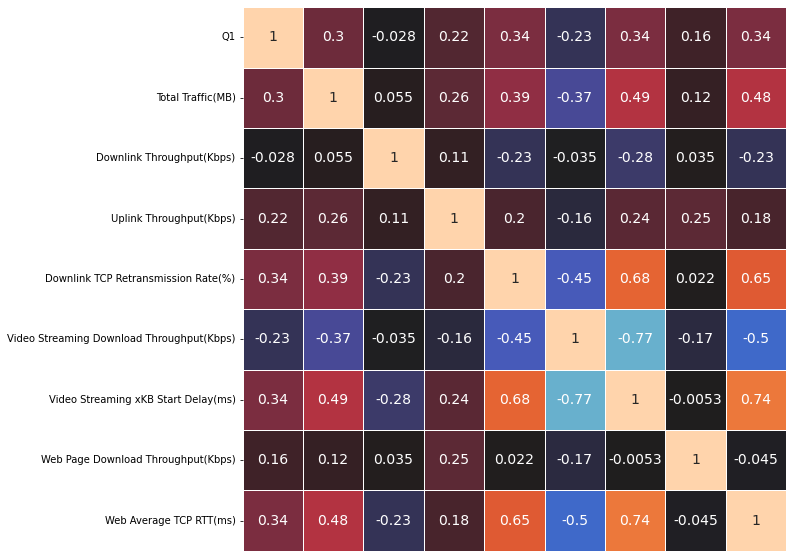

In [22]:
#Проведем корреляционный анализ между оценками и техническими параметрами.
#По коэффициенту ранговой корреляции Спирмена:
corr_m = megafon_df_2.corr(method='spearman')

plt.figure(figsize=(30,10))
p=sns.heatmap(corr_m, center=0, annot=True, linewidths=0.5, square=True, annot_kws={'size': 14}, xticklabels=False, cbar=False)
plt.show()
p.get_figure().savefig('fig5.png')

In [23]:
for name in megafon_df_2.columns:
    a = stats.spearmanr(megafon_df_2['Q1'], megafon_df_2[name])
    print(name,":\t" , round(a.correlation, 3))

Q1 :	 1.0
Total Traffic(MB) :	 0.296
Downlink Throughput(Kbps) :	 -0.028
Uplink Throughput(Kbps) :	 0.222
Downlink TCP Retransmission Rate(%) :	 0.337
Video Streaming Download Throughput(Kbps) :	 -0.23
Video Streaming xKB Start Delay(ms) :	 0.338
Web Page Download Throughput(Kbps) :	 0.162
Web Average TCP RTT(ms) :	 0.339


### Дополнительно проводим регрессионнный анализ по модели наименьших квадратов

In [24]:
#Линейная регрессия

megafon_df_2_LG = rename_col(megafon_df_2)

formula = 'Q1 ~ '
count = 1
for name in megafon_df_2_LG.columns[1:]:
    formula += f" + {name}"

model = smf.ols(formula, data=megafon_df_2_LG)
results = model.fit()
print(results.summary(), '\n')

                            OLS Regression Results                            
Dep. Variable:                     Q1   R-squared:                       0.221
Model:                            OLS   Adj. R-squared:                  0.219
Method:                 Least Squares   F-statistic:                     108.3
Date:                Tue, 07 Jun 2022   Prob (F-statistic):          1.59e-159
Time:                        22:38:53   Log-Likelihood:                 17506.
No. Observations:                3058   AIC:                        -3.499e+04
Df Residuals:                    3049   BIC:                        -3.494e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


## Вывод:
### Сопоставив значения коэффициентов корреляции Спирмена с таблицей силы корреляционной связи Чеддока мы видим, что связь Слабо-Умеренная.
### Построенная нами регрессия может объяснить только 22% значений оценки.
### Влияние значений технических параметров на оценку клиента - Слабо-умеренное.

### 4) Вторая часть опроса. Категории жалоб

In [25]:
#Перейдем ко третьей части анализа, в которой нам понадобится данный с причинами, по которой поставили плохую оценку.
megafon_df_3 = megafon_df.copy()
megafon_df_3['Q2'] = np.where(megafon_df_3['Q1'].isin([9,10]) , '8', megafon_df_3['Q2'])

#Все ячейки со значением NaN примем за ответ №6 - Затрудняюсь ответить.
megafon_df_3['Q2'].fillna('6', inplace=True)

#На основании ранее изученного содержимого датафрема мы видим, что на втором этапе опроса клиент давал несколько вариантов ответов.
#Чтобы учесть каждый вариант ответа продублируем строки под каждый вариант.
megafon_df_3['Q2'] = megafon_df_3['Q2'].apply(lambda x: x.split(', '))
megafon_df_3 = megafon_df_3.explode('Q2')
megafon_df_3['Q2'] = megafon_df_3['Q2'].astype(int)
megafon_df_3 = megafon_df_3[(megafon_df_3['Q2'] > 0) & (megafon_df_3['Q2'] <= 8)]
megafon_df_3['Q2'] = np.where(megafon_df_3['Q2'] == 8 , 0, megafon_df_3['Q2'])

megafon_df_3

,user_id,Q1,Q2,Total Traffic(MB),Downlink Throughput(Kbps),Uplink Throughput(Kbps),Downlink TCP Retransmission Rate(%),Video Streaming Download Throughput(Kbps),Video Streaming xKB Start Delay(ms),Web Page Download Throughput(Kbps),Web Average TCP RTT(ms)
0,1,5,6,775.48846,360.13,86.56,3.93,1859.15,2309,1007.82,83
1,2,5,4,861.96324,3023.54,411.18,1.27,667.47,2080,255.36,425
2,3,1,4,261.11860,790.96,34.20,1.79,1079.60,6367,535.85,485
3,4,8,3,179.18564,2590.97,325.88,0.80,7053.81,3218,1221.02,51
4,5,2,2,351.99208,731.61,223.54,1.15,4550.38,1767,2336.56,68
...,...,...,...,...,...,...,...,...,...,...,...
3108,3109,3,5,171.52629,670.32,40.94,2.35,1711.54,2780,954.91,251
3109,3110,10,0,187.44936,590.29,186.36,2.06,3182.83,2195,1094.62,109
3110,3111,6,1,827.74515,1841.90,373.53,1.21,5675.93,1905,2361.88,202
3110,3111,6,3,827.74515,1841.90,373.53,1.21,5675.93,1905,2361.88,202


In [26]:
megafon_3_grp = megafon_df_3.groupby('Q2').agg({'user_id':'count', 'Q1': 'median', 'Total Traffic(MB)' : 'median',
                                                 'Downlink Throughput(Kbps)' : 'median',
                                                 'Uplink Throughput(Kbps)' : 'median',
                                                 'Downlink TCP Retransmission Rate(%)' : 'median',
                                                 'Video Streaming Download Throughput(Kbps)' : 'median',
                                                 'Video Streaming xKB Start Delay(ms)' : 'median',
                                                 'Web Page Download Throughput(Kbps)' : 'median',
                                                 'Web Average TCP RTT(ms)' : 'median'
                                                 }).reset_index()


megafon_3_grp['Q2, name'] = name_Q2_df
megafon_3_grp_negative =megafon_3_grp[megafon_3_grp['Q2'] > 0]  #Отдельно негативные ответы


megafon_3_grp['Q2, %'] =  round(megafon_3_grp['user_id'] / megafon_3_grp['user_id'].sum() * 100, 2)
megafon_3_grp = megafon_3_grp.sort_values(by='Q2, %', ascending=False)


megafon_3_grp_negative['Q2, %'] = round(megafon_3_grp_negative['user_id'] / megafon_3_grp_negative['user_id'].sum() * 100, 2)
megafon_3_grp_negative = megafon_3_grp_negative.sort_values(by='Q2, %', ascending=False)

megafon_3_grp

,Q2,user_id,Q1,Total Traffic(MB),Downlink Throughput(Kbps),Uplink Throughput(Kbps),Downlink TCP Retransmission Rate(%),Video Streaming Download Throughput(Kbps),Video Streaming xKB Start Delay(ms),Web Page Download Throughput(Kbps),Web Average TCP RTT(ms),"Q2, name","Q2, %"
0,0,1084,10.0,353.941505,1641.36,124.145,1.190,4934.910,1552.0,1848.650,105.0,Без нареканий,25.66
3,3,705,3.0,357.445360,1266.58,115.490,1.430,4056.440,1732.0,1602.720,127.0,3 - Плохое качество связи в зданиях,16.69
6,6,672,3.0,367.768505,1257.63,114.815,1.335,4114.845,1701.0,1615.050,126.5,6 - Затрудняюсь ответить,15.91
1,1,647,3.0,359.804890,1356.12,121.300,1.390,4303.920,1733.0,1596.410,129.0,"1 - Недозвоны, обрывы при звонках",15.31
4,4,625,3.0,380.390560,1111.46,110.170,1.520,3363.090,1863.0,1336.130,144.0,4 - Медленный мобильный интернет,14.79
5,5,222,3.0,400.412685,964.78,98.845,1.520,2927.745,1863.0,1308.435,150.0,5 - Медленная загрузка видео,5.25
2,2,184,3.0,360.689595,1145.28,116.095,1.410,3684.685,1740.0,1567.675,133.0,2 - Время ожидания гудков при звонке,4.36
7,7,86,2.0,358.752610,1371.53,125.745,1.510,4035.425,1782.0,1503.000,107.5,7 - Свой вариант ответа,2.04


In [27]:
#Как распределились жалобы пользователей:

fig = px.bar(megafon_3_grp_negative, y = 'Q2, name', x = 'Q2, %',
             orientation='h',
             text='Q2, %',
             color='Q2, name',
             title='Респределение количества ответов по предлагемым вариантам, %',
             height = 500, width=1000,
             )
fig.update_layout(showlegend=False,
                  xaxis_title="",
                  yaxis_title="",)

fig.show()
fig.write_image("fig6.png")


## Гипотеза №3: Технические показатели клиентов, жалующихся на плохую связь, не отличаются от технических показателей клиентов, жалующихся на плохое качество интернета

In [28]:
#Сравним следующие группы пользователей:
# А - Группа пользователей, которая жаловалась на качество связи (Ответы 1, 2, 3)
# B - Группа пользователей, которая жаловалась на качество интернета (Ответы 4, 5)
# C - Группа пользователей, которая жаловалась на качество обоих компонентов услуг (Ответы 1, 2, 3, 4, 5)
# Из обеих групп удалим дубликаты пользователей, то есть пользователь мог пожаловаться на качество только один раз.
# А так же исключим из групп пользователей, которые попали в обе группы, чтобы не вносить "шум" из другой групп

bad_com = megafon_df_3[megafon_df_3['Q2'].isin([1, 2, 3])]
bad_int = megafon_df_3[megafon_df_3['Q2'].isin([4, 5])]

bad_int.drop_duplicates('user_id', inplace=True)
bad_com.drop_duplicates('user_id', inplace=True)


# Исключим из групп пользователей, которые попали в обе группы.
help_df = pd.concat([bad_int,bad_com])
bad_all_user = help_df.groupby('user_id')['Q1'].count().reset_index()
help_df.drop_duplicates('user_id', inplace=True, keep=False)
help_df

bad_com = help_df[help_df['Q2'].isin([1, 2, 3])]
bad_int = help_df[help_df['Q2'].isin([4, 5])]

print(len(bad_com), len(bad_int))

577 211


/var/folders/hq/p5_ttsnd6195rkr2cb6f80y80000gn/T/ipykernel_52014/1793231972.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/hq/p5_ttsnd6195rkr2cb6f80y80000gn/T/ipykernel_52014/1793231972.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [29]:
#Нулевая гипотеза: Технические параметры Группы C и Группы D равны

print('Группа C - Клиенты, жалующиеся на качество мобильной связи\nГруппа D - Клиенты, жалующиеся на качество интернета\n')
C = bad_com
D = bad_int
col_permutation(C, D, 3)


Группа C - Клиенты, жалующиеся на качество мобильной связи
Группа D - Клиенты, жалующиеся на качество интернета

Значение p-value для каждого параметра
--------------------------------------------------
Total Traffic(MB):	0.37056
Downlink Throughput(Kbps):	0.03
Uplink Throughput(Kbps):	0.09979
Downlink TCP Retransmission Rate(%):	1.0
Video Streaming Download Throughput(Kbps):	0.004
Video Streaming xKB Start Delay(ms):	0.0062
Web Page Download Throughput(Kbps):	0.0002
Web Average TCP RTT(ms):	0.0112


In [30]:
fig = make_subplots(rows=2, cols=4, subplot_titles=bad_com.columns[3:], horizontal_spacing = 0.08, vertical_spacing = 0.1)

for i, name in enumerate(bad_com.columns[3:]):

    n = 1000

    samples_com = bootstrap1(bad_com[name], n)
    samples_int = bootstrap1(bad_int[name], n)

    fig.add_trace(go.Histogram(x=samples_com,
                               marker_color='darkseagreen',
                               ),
                  row=(i//4+1),
                  col=(i%4+1)
                  )

    fig.add_trace(go.Histogram(x=samples_int,
                                   marker_color='steelblue'
                                   ),
                      row=(i//4+1),
                      col=(i%4+1)
                      )

    fig.add_vline(x=np.percentile(samples_com , 2.5), line_width = 2, line_color = 'darkgreen', row=(i//4+1), col=(i%4+1))
    fig.add_vline(x=np.percentile(samples_com , 97.5), line_width = 2, line_color = 'darkgreen', line_dash="dash", row=(i//4+1), col=(i%4+1))

    fig.add_vline(x=np.percentile(samples_int , 2.5), line_width = 2, line_color = 'navy', row=(i//4+1), col=(i%4+1))
    fig.add_vline(x=np.percentile(samples_int , 97.5), line_width = 2, line_color = 'navy', line_dash="dash", row=(i//4+1), col=(i%4+1))

    print(f'{name} ЖАЛОБЫ НА СВЯЗЬ:\t {round(np.percentile(samples_com, 2.5), 2)}\t/\t{round(np.percentile(samples_com , 97.5), 2)}')
    print(f'{name} ЖАЛОБЫ НА ИНТЕРНЕТ:\t {round(np.percentile(samples_int , 2.5), 2)}\t/\t{round(np.percentile(samples_int , 97.5), 2)}')
    print('-'*100)

fig.update_layout(height=700, width=1400, showlegend=False, yaxis_title="")#,title='Распределение значений результатов метода Bootstrap для групп C и D', bargap=0.2)



fig.show()
fig.write_image("fig7.png")

Total Traffic(MB) ЖАЛОБЫ НА СВЯЗЬ:	 388.16	/	416.25
Total Traffic(MB) ЖАЛОБЫ НА ИНТЕРНЕТ:	 421.77	/	449.8
----------------------------------------------------------------------------------------------------
Downlink Throughput(Kbps) ЖАЛОБЫ НА СВЯЗЬ:	 2180.85	/	2532.27
Downlink Throughput(Kbps) ЖАЛОБЫ НА ИНТЕРНЕТ:	 1739.79	/	1977.42
----------------------------------------------------------------------------------------------------
Uplink Throughput(Kbps) ЖАЛОБЫ НА СВЯЗЬ:	 163.92	/	189.76
Uplink Throughput(Kbps) ЖАЛОБЫ НА ИНТЕРНЕТ:	 151.12	/	171.95
----------------------------------------------------------------------------------------------------
Downlink TCP Retransmission Rate(%) ЖАЛОБЫ НА СВЯЗЬ:	 1.58	/	1.79
Downlink TCP Retransmission Rate(%) ЖАЛОБЫ НА ИНТЕРНЕТ:	 1.78	/	2.0
----------------------------------------------------------------------------------------------------
Video Streaming Download Throughput(Kbps) ЖАЛОБЫ НА СВЯЗЬ:	 6109.53	/	6820.79
Video Streaming Download Through

### Вывод: Клиенты, которые жалуются на связь,  имеют технические параметры отличные от технических параметров клиентов, которые жалуются на качество интернета.

## Разберемся с группой клиентов, которая поставила неудовлетворительную оценку, но не определилсь с категорией жалобы (Выбрали категорию 6 или оставили вторую часть опроса без ответа).

In [31]:
# Создадим группу, состоящую из "не определившихся" клиентов (Группа D)
F = megafon_df_3[megafon_df_3['Q2'] == 6]

## Гипотеза №4: Технические параметры не определившихся клиентов равны техническим параметрам клиентов, жалующихся на плохое качество связи.
## Гипотеза №5: Технические параметры не определившихся клиентов равны техническим параметрам клиентов, жалующихся на плохое качество интернета.

In [32]:
bad_com1 = megafon_df_3[megafon_df_3['Q2'].isin([1, 2, 3])]
bad_int1 = megafon_df_3[megafon_df_3['Q2'].isin([4, 5])]

bad_int1.drop_duplicates('user_id', inplace=True)
bad_com1.drop_duplicates('user_id', inplace=True)


col_permutation(bad_int1, bad_com1, 3)
col_permutation(bad_com1, F, 3)
col_permutation(bad_int1, F, 3)

/var/folders/hq/p5_ttsnd6195rkr2cb6f80y80000gn/T/ipykernel_52014/1085180365.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/hq/p5_ttsnd6195rkr2cb6f80y80000gn/T/ipykernel_52014/1085180365.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Значение p-value для каждого параметра
--------------------------------------------------
Total Traffic(MB):	0.49355
Downlink Throughput(Kbps):	0.0254
Uplink Throughput(Kbps):	0.12779
Downlink TCP Retransmission Rate(%):	0.19278
Video Streaming Download Throughput(Kbps):	0.0016
Video Streaming xKB Start Delay(ms):	0.0136
Web Page Download Throughput(Kbps):	0.0002
Web Average TCP RTT(ms):	0.0088
Значение p-value для каждого параметра
--------------------------------------------------
Total Traffic(MB):	0.83412
Downlink Throughput(Kbps):	0.64234
Uplink Throughput(Kbps):	0.61754
Downlink TCP Retransmission Rate(%):	0.34977
Video Streaming Download Throughput(Kbps):	0.79672
Video Streaming xKB Start Delay(ms):	0.43296
Web Page Download Throughput(Kbps):	0.86791
Web Average TCP RTT(ms):	1.0
Значение p-value для каждого параметра
--------------------------------------------------
Total Traffic(MB):	0.65373
Downlink Throughput(Kbps):	0.10499
Uplink Throughput(Kbps):	0.30577
Downlink TCP Retra

In [33]:
for i in range(1,6):
    print(name_Q2_df.iloc[i])
    r = megafon_df_3[megafon_df_3['Q2'] == i]

    col_permutation(r, F, 3)
    print()

0    1 - Недозвоны, обрывы при звонках  
Name: 1, dtype: object
Значение p-value для каждого параметра
--------------------------------------------------
Total Traffic(MB):	0.70133
Downlink Throughput(Kbps):	0.34277
Uplink Throughput(Kbps):	0.34697
Downlink TCP Retransmission Rate(%):	0.55334
Video Streaming Download Throughput(Kbps):	0.49135
Video Streaming xKB Start Delay(ms):	0.49735
Web Page Download Throughput(Kbps):	0.79592
Web Average TCP RTT(ms):	0.83432

0    2 - Время ожидания гудков при звонке  
Name: 2, dtype: object
Значение p-value для каждого параметра
--------------------------------------------------
Total Traffic(MB):	0.79652
Downlink Throughput(Kbps):	0.39536
Uplink Throughput(Kbps):	0.85991
Downlink TCP Retransmission Rate(%):	0.53635
Video Streaming Download Throughput(Kbps):	0.24538
Video Streaming xKB Start Delay(ms):	0.55154
Web Page Download Throughput(Kbps):	0.59714
Web Average TCP RTT(ms):	0.71153

0    3 - Плохое качество связи в зданиях  
Name: 3, dtype: ob

### Вывод: Значения технических параметров не определившихся клиентов статистически ближе к клиентам, которые жалуются на качество связи, а не на качество интернета.

## Поиск весомой метрики

In [34]:
#Какой ответ дают пользователи с самыми плохими значениями технических показателей.

fig = make_subplots(rows=2, cols=4, subplot_titles=megafon_3_grp.columns[3:], horizontal_spacing = 0.08, vertical_spacing = 0.1)

for i, name in enumerate(megafon_3_grp.columns):
    if i > 2 and i < 11:
        if name in ['Downlink Throughput(Kbps)', 'Uplink Throughput(Kbps)', 'Video Streaming Download Throughput(Kbps)', 'Web Page Download Throughput(Kbps)']:
            megafon_3_grp['color'] = np.where(megafon_3_grp[name] == megafon_3_grp[name].min(), 'indianred', 'darkseagreen')
        elif name == 'Total Traffic(MB)':
            megafon_3_grp['color'] = 'darkseagreen'
        else:
            megafon_3_grp['color'] = np.where(megafon_3_grp[name] == megafon_3_grp[name].max(), 'indianred', 'darkseagreen')

        megafon_3_grp['color'] = np.where(megafon_3_grp['Q2'] == 0, 'steelblue', megafon_3_grp['color'])

        fig.add_trace(go.Bar(x=megafon_3_grp['Q2'], y=megafon_3_grp[name], marker_color=megafon_3_grp['color'], marker_line_color='blue'),
                      row=((i-1)//3//2+1),
                      col=((i+1)%4+1))

fig.update_layout(height=700, width=1500, showlegend=False, title = 'Медианные значения технических параметров в зависимости от ответа' )
fig.update_xaxes(dtick=1)

fig.show()
fig.write_image("fig8.png")

Самые плохие значения технических параметров наблюдаются у клиентов жалующихся на категорию 5 - "Медленная загрузка видео"
Посмотрим корреляцию показателя, отвечающего за видео с другими параметрами

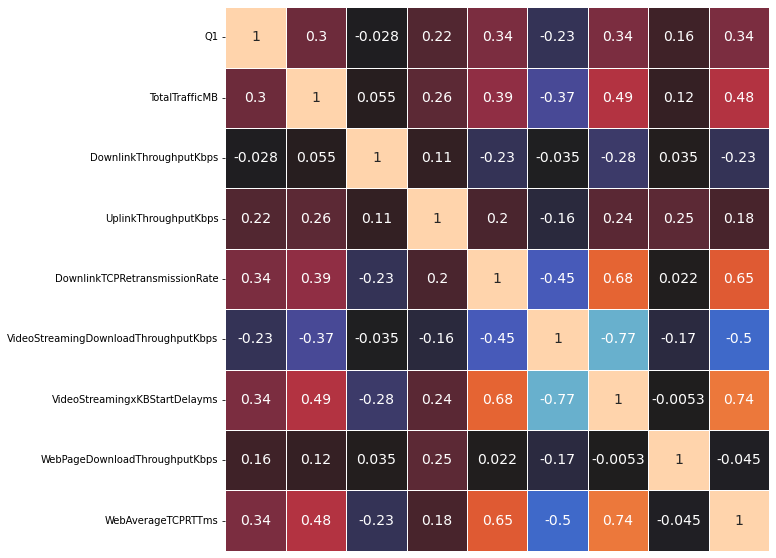

In [35]:
#Проведем корреляционный анализ между оценками и техническими параметрами.
#По коэффициенту ранговой корреляции Спирмена:
corr_m = megafon_df_2.corr(method='spearman')

plt.figure(figsize=(30,10))
p=sns.heatmap(corr_m, center=0, annot=True, linewidths=0.5, square=True, annot_kws={'size': 14}, xticklabels=False, cbar=False)
plt.show()

In [36]:
for name in megafon_df_2.columns:
    if name != 'VideoStreamingxKBStartDelayms':
        a = stats.spearmanr(megafon_df_2['VideoStreamingxKBStartDelayms'], megafon_df_2[name])
        if abs(a.correlation) > 0.6:
            print('!!', end='\t')
        print(name,":\t" , round(a.correlation, 3))

Q1 :	 0.338
TotalTrafficMB :	 0.487
DownlinkThroughputKbps :	 -0.277
UplinkThroughputKbps :	 0.244
!!	DownlinkTCPRetransmissionRate :	 0.68
!!	VideoStreamingDownloadThroughputKbps :	 -0.77
WebPageDownloadThroughputKbps :	 -0.005
!!	WebAverageTCPRTTms :	 0.736


## Вывод: Метрика Video Streaming xKB Start Delay имеет наибольшее количество высоких связей с другими метриками.

In [37]:
formula = 'VideoStreamingxKBStartDelayms ~'
count = 1
for name in megafon_df_2_LG.columns[1:]:
    if name != 'VideoStreamingxKBStartDelayms':
        formula += f" + {name}"

print(formula)
model = smf.ols(formula, data=megafon_df_2_LG)
results = model.fit()
print(results.summary(), '\n')

VideoStreamingxKBStartDelayms ~ + TotalTrafficMB + DownlinkThroughputKbps + UplinkThroughputKbps + DownlinkTCPRetransmissionRate + VideoStreamingDownloadThroughputKbps + WebPageDownloadThroughputKbps + WebAverageTCPRTTms
                                  OLS Regression Results                                 
Dep. Variable:     VideoStreamingxKBStartDelayms   R-squared:                       0.844
Model:                                       OLS   Adj. R-squared:                  0.843
Method:                            Least Squares   F-statistic:                     2349.
Date:                           Tue, 07 Jun 2022   Prob (F-statistic):               0.00
Time:                                   22:40:07   Log-Likelihood:                 2380.8
No. Observations:                           3058   AIC:                            -4746.
Df Residuals:                               3050   BIC:                            -4697.
Df Model:                                      7           

### Построенная регрессионая модель зависимости Video Streaming xKB Start Delay от остальных метрик может объяснить 84% значений.

## Подведение итогов:
**-Жалобы клиентов, поставивших оценку ниже 9,  обоснованы;
-Оценка клиента слабо зависит от технических параметров;
-Клиенты жалующиеся на проблемы со связью имеют технические характеристики, отвечающие за загрузку видео и вебстраниц лучше, чем у клиентов жалующихся на качество интернета;
-Не определившиеся клиенты статистически принадлежат к группе клиентов, которые жалуются на качество связи, а не на качество интернета;
-Для повышения качества услуг лучше направить усилия на уменьшение времени задержки воспроизведения видео.**